
# Data Science with Databricks

## ML is key to disruption & personalization

Being able to ingest and query our C360 database is a first step, but this isn't enough to thrive in a very competitive market.

## Machine learning is data + transforms.

ML is hard because delivering value to business lines isn't only about building a Model. <br>
The ML lifecycle is made of data pipelines: Data-preprocessing, feature engineering, training, inference, monitoring and retraining...<br>
Stepping back, all pipelines are data + code.


<img style="float: right; margin-top: 10px" width="500px" src="https://github.com/databricks-demos/dbdemos-resources/raw/main/images/retail/lakehouse-churn/lakehouse-retail-c360-churn-4.png" />

<img src="https://github.com/databricks-demos/dbdemos-resources/raw/main/images/ds.png" style="float: left;" width="80px"> 
<h3 style="padding: 10px 0px 0px 5px">Marc, as a Data Scientist, needs a data + ML platform accelerating all the ML & DS steps:</h3>

<div style="font-size: 19px; margin-left: 73px; clear: left">
<div class="badge_b"><div class="badge"></div> Build Data Pipeline supporting real time</div>
<div class="badge_b"><div class="badge"></div> Data Exploration</div>
<div class="badge_b"><div class="badge"></div> Feature creation</div>
<div class="badge_b"><div class="badge"></div> Build & train model</div>
<div class="badge_b"><div class="badge"></div> Deploy Model (Batch or serverless)</div>
<div class="badge_b"><div class="badge"></div> Monitoring</div>
</div>

**Marc needs A Lakehouse**. Let's see how we can deploy a Churn model in production within the Lakehouse


###MLflow Components

<div><img src="https://pages.databricks.com/rs/094-YMS-629/images/mlflowcomponents.png" width="850"></div>

### Tracking Experiments with MLflow

Over the course of the machine learning lifecycle, data scientists test many different models from various libraries with different hyperparemeters.  Tracking these various results poses an organizational challenge.  In brief, storing experiements, results, models, supplementary artifacts, and code creates significant challenges in the machine learning lifecycle.

MLflow Tracking is a logging API specific for machine learning and agnostic to libraries and environments that do the training.  It is organized around the concept of **runs**, which are executions of data science code.  Runs are aggregated into **experiments** where many runs can be a part of a given experiment and an MLflow server can host many experiments.

Each run can record the following information:

- **Parameters:** Key-value pairs of input parameters such as the number of trees in a random forest model
- **Metrics:** Evaluation metrics such as RMSE or Area Under the ROC Curve
- **Artifacts:** Arbitrary output files in any format.  This can include images, pickled models, and data files
- **Source:** The code that originally ran the experiement

MLflow tracking also serves as a **model registry** so tracked models can easily be stored and, as necessary, deployed into production.

Experiments can be tracked using libraries in Python, R, and Java as well as by using the CLI and REST calls.

<div><img src="https://pages.databricks.com/rs/094-YMS-629/images/mlflow-tracking.png" style="height: 300px; margin: 20px"/></div>
<div><img src="https://pages.databricks.com/rs/094-YMS-629/images/3 - Unify data and ML across the full lifecycle.png" width="950"></div>


# Building a Churn Prediction Model

Let's see how we can now leverage the C360 data to build a model predicting and explaining customer Churn.

<img src="https://github.com/databricks-demos/dbdemos-resources/raw/main/images/retail/lakehouse-churn/lakehouse-retail-churn-ds-flow.png" width="1000px">

*Note: Make sure you switched to the "Machine Learning" persona on the top left menu.*

In [0]:
%run ./includes/SetupLab

### Our training Data
The tables generated with the DLT pipeline contain a **churn** flag which will be used as the label for training of the model.
The predictions will eventually be applied to the tables generated with the spark pipeline.

In [0]:
spark.sql("use catalog main")
spark.sql("use database "+databaseForDLT)


DataFrame[]

In [0]:
## Use the tables within the DlT schema to creat our model.
print("We will be working with our DLT Schema to build our final predication table:\n" + databaseForDLT + "\n")

We will be working with our DLT Schema to build our final predication table:
odl_user_1513183_databrickslabs_com_retail_dlt



## Data exploration and analysis

Let's review our dataset and start analyze the data we have to predict our churn

In [0]:
# Read our churn_features table
churn_dataset = spark.table("churn_features")
display(churn_dataset)

user_id,email,creation_date,last_activity_date,firstname,lastname,address,channel,country,gender,age_group,churn,order_count,total_amount,total_item,last_transaction,platform,event_count,session_count,last_event,days_since_creation,days_since_last_activity,days_last_event
95d6ac28-e966-4a53-a86e-650a3cf1af26,51969eb4e1347f3f8deaa2bb60f4b079e95ca177,2023-05-10T00:00:00Z,2024-11-08T07:40:07Z,Troy,Snyder,"395 Mark Parks Apt. 739 North Coreyville, HI 09312",WEBAPP,SPAIN,1,4,1,3,172,6,2024-11-15T06:55:03Z,ios,3,3,2024-11-01T14:20:14Z,555,7,14
eabaac61-6b6c-4fdc-bc20-35be93e5c5b2,7aabd0c304e43f54b3499149273fd0ec76450d9f,2023-09-17T00:00:00Z,2024-11-13T03:30:06Z,Lori,Hoover,"704 Frank Ports East Angel, VT 09339",PHONE,SPAIN,1,8,0,3,217,7,2024-11-15T15:58:25Z,ios,3,3,2024-11-04T07:01:57Z,425,2,11
20bcfb39-c4c1-4d78-b3bf-a4cb8144c053,e9d84cdd44d1737f78fca68470240cedd96e3537,2023-12-28T00:00:00Z,2024-11-04T06:19:30Z,Jeffrey,Robinson,"789 Horton Spur Suite 583 Jaimebury, ND 31929",WEBAPP,USA,1,6,1,4,166,8,2024-11-11T22:39:58Z,ios,4,4,2024-11-09T05:02:23Z,323,11,6
5301ebca-c701-4f0a-93f2-db3edec7192a,6d154edf80c87ae5a3d3788432957a4c0b504b61,2023-08-30T00:00:00Z,2024-11-04T03:38:35Z,Jason,Lewis,"045 Michael Trail Apt. 368 Port Andrewshire, ND 49952",WEBAPP,FR,1,9,0,2,55,3,2024-11-02T17:39:41Z,ios,2,2,2024-11-08T12:27:52Z,443,11,7
6eae2648-cc47-4783-9277-ef6126ee5278,54407f1c8d204ff853f5532a9b5f19d72759c8d7,2023-10-31T00:00:00Z,2024-11-05T11:18:45Z,Kevin,Turner,"21823 Nicholas Estate Apt. 661 Smithtown, GU 60195",WEBAPP,SPAIN,1,5,1,4,127,6,2024-11-14T09:12:25Z,other,4,4,2024-11-12T23:19:49Z,381,10,3
a62dbf3d-5cc0-4f71-a48d-7f65d71fa8ee,9f6bb5562ee779270a4c4522363f704f1f9f25e6,2023-11-05T00:00:00Z,2024-11-07T15:11:08Z,Shane,West,"322 Diane Parks Yoderfurt, LA 38703",WEBAPP,USA,0,2,1,1,40,2,2024-11-06T05:24:45Z,other,1,1,2024-11-15T12:57:03Z,376,8,0
f9e4f615-4252-4a9f-a0ca-e42435e22dce,88ad23d4ab213b9eea96611a99f01bc42bffc9f1,2023-10-06T00:00:00Z,2024-11-07T22:13:10Z,Taylor,Mcdonald,USNV Curry FPO AP 71072,WEBAPP,FR,0,2,1,4,187,9,2024-11-13T08:55:46Z,android,4,4,2024-11-10T13:27:31Z,406,8,5
afd40761-6f62-4a82-add7-fd198e4b4c5d,fcf149ed7c9a1ff2645ff3141d939ea3c47f6a5a,2024-05-27T00:00:00Z,2024-11-04T23:07:24Z,Joseph,Adams,"660 Mark Isle East Jon, PA 40213",WEBAPP,USA,1,8,1,3,168,8,2024-11-09T23:44:06Z,ios,3,3,2024-11-02T01:45:13Z,172,11,13
122cf027-a28f-4641-8b34-a97e750b0f05,0c4fa8863ab6230b020c862044bebc14fb07de9c,2024-04-07T00:00:00Z,2024-11-09T12:09:53Z,Autumn,Andrews,"3540 Samuel Ports Suite 945 North Gregoryport, CO 47634",MOBILE,FR,1,7,1,5,191,9,2024-11-09T17:56:41Z,other,5,5,2024-11-15T00:20:04Z,222,6,0
3466fc6c-0d35-448f-a48e-767f6ba2f1be,e29839a8f5c9b5ccb327947025269574863090f2,2024-10-10T00:00:00Z,2024-11-12T16:14:38Z,Kristina,Kramer,"48716 Kaitlyn Park Apt. 425 Samanthaside, MA 10297",PHONE,USA,1,0,1,2,125,5,2024-11-07T22:53:17Z,other,2,2,2024-11-13T10:04:44Z,36,3,2


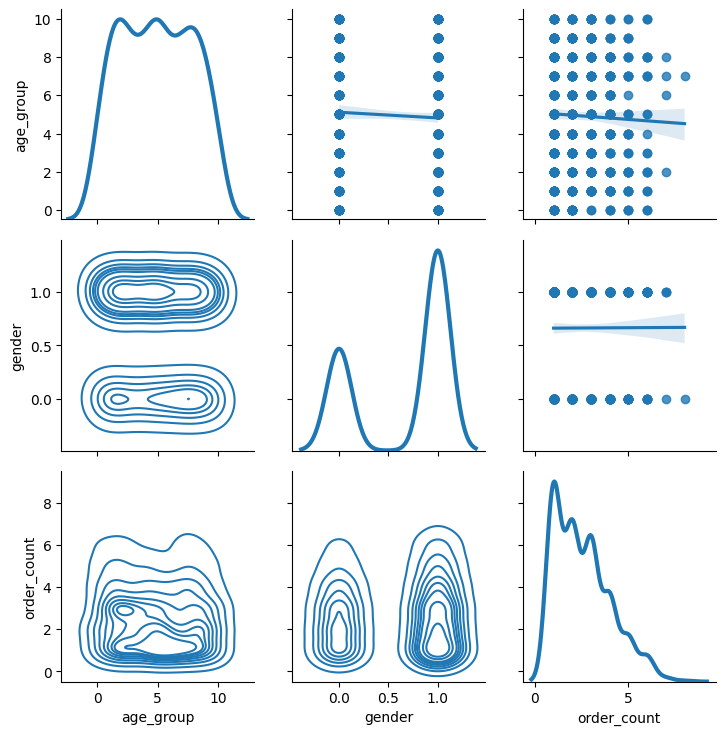

In [0]:
import seaborn as sns
g = sns.PairGrid(churn_dataset.sample(0.01).toPandas()[['age_group','gender','order_count']], diag_sharey=False)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3)
g.map_upper(sns.regplot)

### Further data analysis and preparation using pandas API

Because our Data Scientist team is familiar with Pandas, we'll use `pandas on spark` to scale `pandas` code. The Pandas instructions will be converted in the spark engine under the hood and distributed at scale.

Typicaly a Data Science project would involve more a advanced preparation and likely require extra data prep steps, including more a complex feature preparation.

In [0]:
# Convert to pandas on spark
dataset = churn_dataset.pandas_api()
dataset.describe()  
# Drop columns we don't want to use in our model
dataset = dataset.drop(columns=['address', 'email', 'firstname', 'lastname', 'creation_date', 'last_activity_date', 'last_event'])
# Drop missing values
dataset = dataset.dropna()
# print the ten first rows
dataset[:10]

,user_id,channel,country,gender,age_group,churn,order_count,total_amount,total_item,last_transaction,platform,event_count,session_count,days_since_creation,days_since_last_activity,days_last_event
0,95d6ac28-e966-4a53-a86e-650a3cf1af26,WEBAPP,SPAIN,1,4,1,3,172,6,2024-11-15 06:55:03,ios,3,3,555,7,14
1,eabaac61-6b6c-4fdc-bc20-35be93e5c5b2,PHONE,SPAIN,1,8,0,3,217,7,2024-11-15 15:58:25,ios,3,3,425,2,11
2,20bcfb39-c4c1-4d78-b3bf-a4cb8144c053,WEBAPP,USA,1,6,1,4,166,8,2024-11-11 22:39:58,ios,4,4,323,11,6
3,5301ebca-c701-4f0a-93f2-db3edec7192a,WEBAPP,FR,1,9,0,2,55,3,2024-11-02 17:39:41,ios,2,2,443,11,7
4,6eae2648-cc47-4783-9277-ef6126ee5278,WEBAPP,SPAIN,1,5,1,4,127,6,2024-11-14 09:12:25,other,4,4,381,10,3
5,a62dbf3d-5cc0-4f71-a48d-7f65d71fa8ee,WEBAPP,USA,0,2,1,1,40,2,2024-11-06 05:24:45,other,1,1,376,8,0
6,f9e4f615-4252-4a9f-a0ca-e42435e22dce,WEBAPP,FR,0,2,1,4,187,9,2024-11-13 08:55:46,android,4,4,406,8,5
7,afd40761-6f62-4a82-add7-fd198e4b4c5d,WEBAPP,USA,1,8,1,3,168,8,2024-11-09 23:44:06,ios,3,3,172,11,13
8,122cf027-a28f-4641-8b34-a97e750b0f05,MOBILE,FR,1,7,1,5,191,9,2024-11-09 17:56:41,other,5,5,222,6,0
9,3466fc6c-0d35-448f-a48e-767f6ba2f1be,PHONE,USA,1,0,1,2,125,5,2024-11-07 22:53:17,other,2,2,36,3,2



## Write to Feature Store

<img src="https://github.com/QuentinAmbard/databricks-demo/raw/main/product_demos/mlops-end2end-flow-feature-store.png" style="float:right" width="500" />

Once our features are ready, we can save them in Databricks Feature Store. Under the hood, features store are backed by a Delta Lake table.

This will allow discoverability and reusability of our feature across our organization, increasing team efficiency.

Feature store will bring traceability and governance in our deployment, knowing which model is dependent of which set of features. It also simplify realtime serving.

Make sure you're using the "Machine Learning" menu to have access to your feature store using the UI.

In [0]:
from databricks.feature_store import FeatureStoreClient

fs = FeatureStoreClient()

try:
  #drop table if exists
  fs.drop_table('churn_user_features')
except: pass

#Note: You might need to delete the FS table using the UI
churn_feature_table = fs.create_table(
  name='churn_user_features',
  primary_keys='user_id',
  schema=dataset.spark.schema(),
  description='These features are derived from the churn_bronze_customers table in the lakehouse.  We created dummy variables for the categorical columns, cleaned up their names, and added a boolean flag for whether the customer churned or not.  No aggregations were performed.'
)

fs.write_table(df=dataset.to_spark(), name='churn_user_features', mode='overwrite')
features = fs.read_table('churn_user_features')
display(features)

2024/11/15 23:24:19 INFO databricks.ml_features._compute_client._compute_client: Setting columns ['user_id'] of table 'main.odl_user_1513183_databrickslabs_com_retail_dlt.churn_user_features' to NOT NULL.
2024/11/15 23:24:23 INFO databricks.ml_features._compute_client._compute_client: Setting Primary Keys constraint ['user_id'] on table 'main.odl_user_1513183_databrickslabs_com_retail_dlt.churn_user_features'.
2024/11/15 23:24:24 INFO databricks.ml_features._compute_client._compute_client: Created feature table 'main.odl_user_1513183_databrickslabs_com_retail_dlt.churn_user_features'.


user_id,channel,country,gender,age_group,churn,order_count,total_amount,total_item,last_transaction,platform,event_count,session_count,days_since_creation,days_since_last_activity,days_last_event
95d6ac28-e966-4a53-a86e-650a3cf1af26,WEBAPP,SPAIN,1,4,1,3,172,6,2024-11-15T06:55:03Z,ios,3,3,555,7,14
eabaac61-6b6c-4fdc-bc20-35be93e5c5b2,PHONE,SPAIN,1,8,0,3,217,7,2024-11-15T15:58:25Z,ios,3,3,425,2,11
20bcfb39-c4c1-4d78-b3bf-a4cb8144c053,WEBAPP,USA,1,6,1,4,166,8,2024-11-11T22:39:58Z,ios,4,4,323,11,6
5301ebca-c701-4f0a-93f2-db3edec7192a,WEBAPP,FR,1,9,0,2,55,3,2024-11-02T17:39:41Z,ios,2,2,443,11,7
6eae2648-cc47-4783-9277-ef6126ee5278,WEBAPP,SPAIN,1,5,1,4,127,6,2024-11-14T09:12:25Z,other,4,4,381,10,3
a62dbf3d-5cc0-4f71-a48d-7f65d71fa8ee,WEBAPP,USA,0,2,1,1,40,2,2024-11-06T05:24:45Z,other,1,1,376,8,0
f9e4f615-4252-4a9f-a0ca-e42435e22dce,WEBAPP,FR,0,2,1,4,187,9,2024-11-13T08:55:46Z,android,4,4,406,8,5
afd40761-6f62-4a82-add7-fd198e4b4c5d,WEBAPP,USA,1,8,1,3,168,8,2024-11-09T23:44:06Z,ios,3,3,172,11,13
122cf027-a28f-4641-8b34-a97e750b0f05,MOBILE,FR,1,7,1,5,191,9,2024-11-09T17:56:41Z,other,5,5,222,6,0
3466fc6c-0d35-448f-a48e-767f6ba2f1be,PHONE,USA,1,0,1,2,125,5,2024-11-07T22:53:17Z,other,2,2,36,3,2


## Training a model from the table in the Feature Store

As we will be using a scikit-learn algorith, we will convert the feature table into a pandas model

In [0]:
# Convert to Pandas
df = features.toPandas()

#### Train - test splitting

In [0]:
# Split to train and test set
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df, test_size=0.3, random_state=42)

#### Define the preprocessing steps

In [0]:
# Select the columns
from databricks.automl_runtime.sklearn.column_selector import ColumnSelector
supported_cols = ["event_count", "gender", "total_amount", "country", "order_count", "channel", "total_item", "days_since_last_activity", "days_last_event", "days_since_creation", "session_count", "age_group", "platform"]
col_selector = ColumnSelector(supported_cols)

In [0]:
# Preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler

num_imputers = []
num_imputers.append(("impute_mean", SimpleImputer(), ["age_group", "days_last_event", "days_since_creation", "days_since_last_activity", "event_count", "gender", "order_count", "session_count", "total_amount", "total_item"]))

numerical_pipeline = Pipeline(steps=[
    ("converter", FunctionTransformer(lambda df: df.apply(pd.to_numeric, errors="coerce"))),
    ("imputers", ColumnTransformer(num_imputers)),
    ("standardizer", StandardScaler()),
])

numerical_transformers = [("numerical", numerical_pipeline, ["event_count", "gender", "total_amount", "order_count", "total_item", "days_since_last_activity", "days_last_event", "days_since_creation", "session_count", "age_group"])]

In [0]:
# Treating categorical variables
from databricks.automl_runtime.sklearn import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

one_hot_imputers = []
one_hot_pipeline = Pipeline(steps=[
    ("imputers", ColumnTransformer(one_hot_imputers, remainder="passthrough")),
    ("one_hot_encoder", OneHotEncoder(handle_unknown="indicator")),
])
categorical_one_hot_transformers = [("onehot", one_hot_pipeline, ["age_group", "channel", "country", "event_count", "gender", "order_count", "platform", "session_count"])]

In [0]:
# Final transformation of the columns
from sklearn.compose import ColumnTransformer
transformers = numerical_transformers + categorical_one_hot_transformers
preprocessor = ColumnTransformer(transformers, remainder="passthrough", sparse_threshold=1)

In [0]:
# Separate target column from features
target_col = "churn"
X_train = train_df.drop([target_col], axis=1)
y_train = train_df[target_col]

X_test = test_df.drop([target_col], axis=1)
y_test = test_df[target_col]

#### Training a model and logging everything with MLflow

In [0]:
import pandas as pd
import mlflow
from mlflow.models import Model
from mlflow import pyfunc
from mlflow.pyfunc import PyFuncModel

import sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

# Start a run
with mlflow.start_run(run_name="simple-RF-run") as run:

  classifier = RandomForestClassifier()
  model = Pipeline([
      ("column_selector", col_selector),
      ("preprocessor", preprocessor),
      ("classifier", classifier),
  ])

  # Enable automatic logging of input samples, metrics, parameters, and models
  mlflow.sklearn.autolog(
      log_input_examples=True,
      silent=True)

  model.fit(X_train, y_train)

  # Log metrics for the test set
  mlflow_model = Model()
  pyfunc.add_to_model(mlflow_model, loader_module="mlflow.sklearn")
  pyfunc_model = PyFuncModel(model_meta=mlflow_model, model_impl=model)
  X_test[target_col] = y_test
  test_eval_result = mlflow.evaluate(
      model=pyfunc_model,
      data=X_test,
      targets=target_col,
      model_type="classifier",
      evaluator_config = {"log_model_explainability": False,
                          "metric_prefix": "test_" , "pos_label": 1 }
  )


Uploading artifacts:   0%|          | 0/3 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/11 [00:00<?, ?it/s]

/databricks/python/lib/python3.11/site-packages/mlflow/types/utils.py:406: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2024/11/15 23:46:21 INFO mlflow.models.evaluation.default_evaluator: Computing model predictions.
2024/11/15 23:46:23 INFO mlflow.models.evaluation.default_evaluator: The evaluation dataset is inferred as binary dataset, positive label is 1

<Figure size 1050x700 with 0 Axes>

#### Explore the above in the UI

From the experiments page on the left pane and select the "simple-RF-run" experiment as noted above

<i18n value="5802ff47-58b5-4789-973d-2fb855bf347a"/>



### Model Registry

The MLflow Model Registry component is a centralized model store, set of APIs, and UI, to collaboratively manage the full lifecycle of an MLflow Model. It provides model lineage (which MLflow Experiment and Run produced the model), model versioning, stage transitions (e.g. from staging to production), annotations (e.g. with comments, tags), and deployment management (e.g. which production jobs have requested a specific model version).

Model registry has the following features:<br><br>

* **Central Repository:** Register MLflow models with the MLflow Model Registry. A registered model has a unique name, version, stage, and other metadata.
* **Model Versioning:** Automatically keep track of versions for registered models when updated.
* **Model Stage:** Assigned preset or custom stages to each model version, like “Staging” and “Production” to represent the lifecycle of a model.
* **Model Stage Transitions:** Record new registration events or changes as activities that automatically log users, changes, and additional metadata such as comments.
* **CI/CD Workflow Integration:** Record stage transitions, request, review and approve changes as part of CI/CD pipelines for better control and governance.

<div><img src="https://files.training.databricks.com/images/eLearning/ML-Part-4/model-registry.png" style="height: 400px; margin: 20px"/></div>

<img src="https://files.training.databricks.com/images/icon_note_24.png"/> See <a href="https://mlflow.org/docs/latest/registry.html" target="_blank">the MLflow docs</a> for more details on the model registry.

In [0]:
from mlflow.tracking.client import MlflowClient
mlflow.set_registry_uri("databricks-uc")

logged_model = 'runs:/' + run.info.run_id + '/model'

print("Registeting the model under the name '" + modelName + "'")
result=mlflow.register_model(logged_model, 'main.'+databaseForDLT+'.'+modelName, await_registration_for=0)

Registeting the model under the name 'retail_churn_odl_user_1513183_databrickslabs_com'


Successfully registered model 'main.odl_user_1513183_databrickslabs_com_retail_dlt.retail_churn_odl_user_1513183_databrickslabs_com'.


Uploading artifacts:   0%|          | 0/11 [00:00<?, ?it/s]

Created version '1' of model 'main.odl_user_1513183_databrickslabs_com_retail_dlt.retail_churn_odl_user_1513183_databrickslabs_com'.


In [0]:
import time

# Retrieving the model
client = MlflowClient()
model_version_details = None
while True:
  model_version_details = client.get_model_version(name='main.'+databaseForDLT+'.'+modelName, version=result.version)
  if model_version_details.status == 'READY': break
  time.sleep(5)

#print(model_version_details)

# create "Champion" alias for version 1 of model "prod.ml_team.iris_model"
client.set_registered_model_alias('main.'+databaseForDLT+'.'+modelName, "production", 1)

#client.transition_model_version_stage(
#    name=model_version_details.name,
#    version=model_version_details.version,
#    stage="Production",
#    archive_existing_versions = True
#)


## Accelerating Churn model creation using MLFlow and Databricks Auto-ML

MLflow is an open source project allowing model tracking, packaging and deployment. Everytime your datascientist team work on a model, Databricks will track all the parameter and data used and will save it. This ensure ML traceability and reproductibility, making it easy to know which model was build using which parameters/data.

### A glass-box solution that empowers data teams without taking away control

While Databricks simplify model deployment and governance (MLOps) with MLFlow, bootstraping new ML projects can still be long and inefficient. 

Instead of creating the same boilerplate for each new project, Databricks Auto-ML can automatically generate state of the art models for Classifications, regression, and forecast.


<img width="1000" src="https://github.com/QuentinAmbard/databricks-demo/raw/main/retail/resources/images/auto-ml-full.png"/>


Models can be directly deployed, or instead leverage generated notebooks to boostrap projects with best-practices, saving you weeks of efforts.

<br style="clear: both">

<img style="float: right" width="600" src="https://github.com/QuentinAmbard/databricks-demo/raw/main/retail/resources/images/churn-auto-ml.png"/>

### Using Databricks Auto ML with our Churn dataset

Auto ML is available in the "Machine Learning" space. All we have to do is start a new Auto-ML experimentation and select the feature table we just created (`churn_features`)

Our prediction target is the `churn` column.

Click on Start, and Databricks will do the rest.

While this is done using the UI, you can also leverage the [python API](https://docs.databricks.com/applications/machine-learning/automl.html#automl-python-api-1)

### Next up
[Use the model to predict the churn]($./02.1 - Machine Learning - Inference)